### AIR QUALITY PREDICTION

#### NAME :ANJALI L

#### ORGANIZATION: DATA 24LIFE TECHNOLOGIES

#### OVERVIEW OF THE PROBLEM STATEMENT

This dataset provides real-time air quality monitoring information from various sites across the United States, collected by the U.S. Environmental Protection Agency (EPA) and associated sources. It consists of 498 records and 42 variables, encompassing a mix of geographic, temporal, and pollutant concentration data.

The dataset captures key atmospheric pollutants such as Ozone (O₃), PM2.5, and PM10, along with their corresponding Air Quality Index (AQI) values. For each monitoring site, attributes like latitude, longitude, elevation, state, and site status are included, alongside timestamps in both local and GMT formats.

# Data Quality Overview:

* Complete fields: Geographic, timestamp, and AQI label/sorting columns

* Missing values: Raw pollutant concentrations (OZONE, PM10, PM2.5) have many missing values

    ~ Example: OZONE (only 201 non-null out of 498)

* Target columns like PM2.5 AQI (For Sorting) are complete and suitable for ML modeling

# Criteria for choosing PM2.5 AQI (for sorting) as ML target:

* Numerical and continuous (for regression)

* Few missing values

* Directly measurable or meaningful (e.g., AQI values)

* Not a derived or redundant field


This dataset supports various analytics and predictive modeling tasks, including regression-based AQI forecasting and classification of air quality levels. It is a valuable resource for public health assessment, environmental policy development, and data-driven decision-making in air quality management.



In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.feature_selection import SelectKBest,f_regression,RFE
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


import warnings
warnings.filterwarnings('ignore')

## DATA COLLECTION

In [8]:
print("\n Collecting Data...........")

In [9]:
Air_Quality_data=pd.read_csv('Air Now Current Monitor Data Public_2973822403014361311.csv')
print("\n Dataset Loaded Successfully....")
print(Air_Quality_data)


 Dataset Loaded Successfully....
    EPA AQS ID Country Code  \
0     40030011           US   
1     40031005           US   
2     40051008           US   
3     40070008           US   
4     40070009           US   
..         ...          ...   
493  MMCA81010           US   
494  MMCA81011           US   
495  MMCA81014           US   
496  MMCA81021           US   
497  MMGBU1000           US   

                                           Data Source EPA Region  Elevation  \
0          Arizona Department of Environmental Quality         R9     1280.7   
1          Arizona Department of Environmental Quality         R9      132.1   
2          Arizona Department of Environmental Quality         R9     2121.3   
3          Arizona Department of Environmental Quality         R9     1501.8   
4          Arizona Department of Environmental Quality         R9     1085.5   
..                                                 ...        ...        ...   
493                     Californi

In [10]:
Air_quality_df=pd.DataFrame(Air_Quality_data)

In [11]:
print("\n Printing Dataset Info....")

Air_quality_df.info()




 Printing Dataset Info....
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 498 entries, 0 to 497
Data columns (total 42 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   EPA AQS ID                       498 non-null    object 
 1   Country Code                     498 non-null    object 
 2   Data Source                      498 non-null    object 
 3   EPA Region                       498 non-null    object 
 4   Elevation                        498 non-null    float64
 5   GMT Offset Amount (hours)        498 non-null    int64  
 6   Latitude                         498 non-null    float64
 7   Local Time at Monitor            498 non-null    object 
 8   Longitude                        498 non-null    float64
 9   OZONE                            201 non-null    float64
 10  Ozone & PM AQI                   330 non-null    float64
 11  Ozone & PM AQI (For Labeling)    498 non-null    object 

In [12]:
print(Air_quality_df.shape)

(498, 42)


In [13]:
print(Air_quality_df.describe())

         Elevation  GMT Offset Amount (hours)    Latitude   Longitude  \
count   498.000000                 498.000000  498.000000  498.000000   
mean    178.110040                  -7.917671   35.026204 -120.055580   
std     384.425615                   0.624169    4.131474    9.332564   
min      -7.900000                 -10.000000   19.060655 -159.365000   
25%       0.000000                  -8.000000   33.570055 -121.587184   
50%       0.000000                  -8.000000   35.307600 -119.084880   
75%     137.200000                  -8.000000   37.675550 -116.020035   
max    2440.000000                  -7.000000   41.756130 -109.539683   

            OZONE  Ozone & PM AQI  Ozone & PM AQI (For Sorting)   Ozone AQI  \
count  201.000000      330.000000                    498.000000  207.000000   
mean    41.323383       37.984848                   -311.841365   40.077295   
std      8.979972       15.911507                    490.955571   10.274099   
min     11.000000        0

In [14]:
print(Air_quality_df.isnull().sum())

EPA AQS ID                           0
Country Code                         0
Data Source                          0
EPA Region                           0
Elevation                            0
GMT Offset Amount (hours)            0
Latitude                             0
Local Time at Monitor                0
Longitude                            0
OZONE                              297
Ozone & PM AQI                     168
Ozone & PM AQI (For Labeling)        0
Ozone & PM AQI (For Sorting)         0
Ozone AQI                          291
Ozone AQI (For Labeling)             0
Ozone AQI (For Sorting)              0
Ozone Measured at Site               0
Ozone Unit of Measure              297
PM10                               337
PM10 AQI                           336
PM10 AQI (For Labeling)              0
PM10 AQI (For Sorting)               0
PM10 Measured at Site                0
PM10 Unit of Measure               337
PM2.5                              310
PM2.5 AQI                

In [15]:
#missing values are located in categorical columns
# Identify categorical columns in the dataset
categorical_columns = Air_quality_df.select_dtypes(include='object').columns
numerical_columns = Air_quality_df.select_dtypes(include='number').columns

In [16]:
print(categorical_columns)

Index(['EPA AQS ID', 'Country Code', 'Data Source', 'EPA Region',
       'Local Time at Monitor', 'Ozone & PM AQI (For Labeling)',
       'Ozone AQI (For Labeling)', 'Ozone Unit of Measure',
       'PM10 AQI (For Labeling)', 'PM10 Unit of Measure',
       'PM2.5 AQI (For Labeling)', 'PM2.5 Unit of Measure',
       'PM2.5 & PM10 AQI (For Labeling)', 'Reporting Area(s)', 'Site Name',
       'State Name', 'Site Operational Status', 'ValidTime', 'MonitorType'],
      dtype='object')


In [17]:
print(numerical_columns)

Index(['Elevation', 'GMT Offset Amount (hours)', 'Latitude', 'Longitude',
       'OZONE', 'Ozone & PM AQI', 'Ozone & PM AQI (For Sorting)', 'Ozone AQI',
       'Ozone AQI (For Sorting)', 'Ozone Measured at Site', 'PM10', 'PM10 AQI',
       'PM10 AQI (For Sorting)', 'PM10 Measured at Site', 'PM2.5', 'PM2.5 AQI',
       'PM2.5 AQI (For Sorting)', 'PM2.5 Measured at Site', 'PM2.5 & PM10 AQI',
       'PM2.5 & PM10 AQI (For Sorting)', 'ObjectId', 'x', 'y'],
      dtype='object')


In [18]:


# Fill missing values in each categorical column with the mode (most frequent value)
for col in categorical_columns:
    if Air_quality_df[col].isnull().sum() > 0:  # Only process columns with missing values
       Air_quality_df[col].fillna(Air_quality_df[col].mode()[0], inplace=True)

# Optional: Print confirmation of completed operation
print("Missing values in categorical columns handled successfully.")



Missing values in categorical columns handled successfully.


In [19]:
# Fill missing values in each categorical column with the mode (most frequent value)
for col in numerical_columns:
    if Air_quality_df[col].isnull().sum() > 0:  # Only process columns with missing values
       Air_quality_df[col].fillna(Air_quality_df[col].mode()[0], inplace=True)

# Optional: Print confirmation of completed operation
print("Missing values in Numerical columns handled successfully.")

Missing values in Numerical columns handled successfully.


In [20]:
Air_quality_df.isnull().sum()

EPA AQS ID                         0
Country Code                       0
Data Source                        0
EPA Region                         0
Elevation                          0
GMT Offset Amount (hours)          0
Latitude                           0
Local Time at Monitor              0
Longitude                          0
OZONE                              0
Ozone & PM AQI                     0
Ozone & PM AQI (For Labeling)      0
Ozone & PM AQI (For Sorting)       0
Ozone AQI                          0
Ozone AQI (For Labeling)           0
Ozone AQI (For Sorting)            0
Ozone Measured at Site             0
Ozone Unit of Measure              0
PM10                               0
PM10 AQI                           0
PM10 AQI (For Labeling)            0
PM10 AQI (For Sorting)             0
PM10 Measured at Site              0
PM10 Unit of Measure               0
PM2.5                              0
PM2.5 AQI                          0
PM2.5 AQI (For Labeling)           0
P

In [21]:
Air_quality_duplicated=Air_quality_df.duplicated().sum()

if (Air_quality_duplicated== 0):
    print("\nNo duplicated data found!")
else:
    print("\nDuplicated data is Found,please remove it!")


No duplicated data found!


In [22]:
print("\nNumerical columns:",numerical_columns)


Numerical columns: Index(['Elevation', 'GMT Offset Amount (hours)', 'Latitude', 'Longitude',
       'OZONE', 'Ozone & PM AQI', 'Ozone & PM AQI (For Sorting)', 'Ozone AQI',
       'Ozone AQI (For Sorting)', 'Ozone Measured at Site', 'PM10', 'PM10 AQI',
       'PM10 AQI (For Sorting)', 'PM10 Measured at Site', 'PM2.5', 'PM2.5 AQI',
       'PM2.5 AQI (For Sorting)', 'PM2.5 Measured at Site', 'PM2.5 & PM10 AQI',
       'PM2.5 & PM10 AQI (For Sorting)', 'ObjectId', 'x', 'y'],
      dtype='object')


### OUTLIERS DETECTION

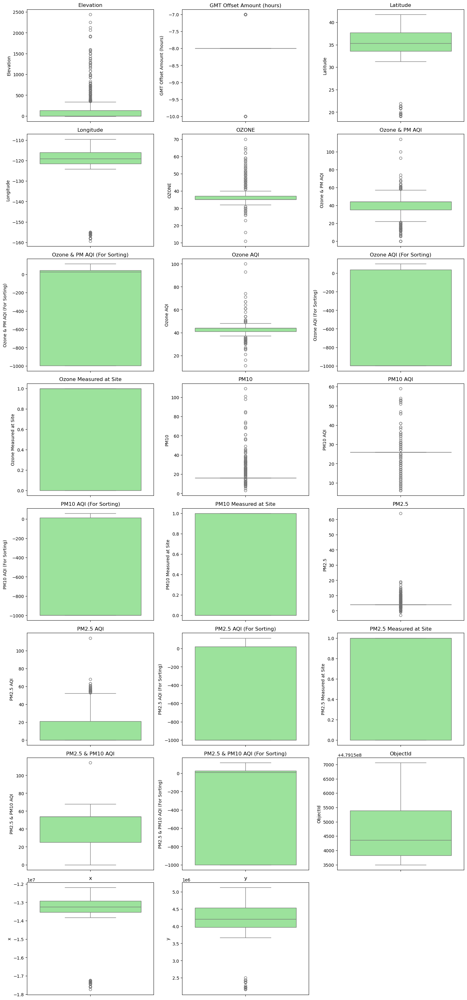

In [24]:

import math

# Count of numerical columns
num_cols = len(numerical_columns)

# Set number of columns per row
n_cols = 3

# Calculate the required number of rows
n_rows = math.ceil(num_cols / n_cols)

# Create the figure
plt.figure(figsize=(n_cols * 5, n_rows * 4))  # Adjust figure size as needed

# Create a subplot for each numerical column
for i, col in enumerate(numerical_columns):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.boxplot(y=Air_quality_df[col], color='lightgreen')
    plt.title(col)

plt.tight_layout()
plt.show()


In [25]:
# Outlier fix
def outlier_fix(Air_quality_df,numerical_columns):
    for col in numerical_columns:
        Q1 = Air_quality_df[col].quantile(0.25)
        Q3 = Air_quality_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        Air_quality_df[col] = Air_quality_df[col].clip(lower = lower_bound, upper = upper_bound)
    return Air_quality_df

In [26]:
Air_quality_df1 = outlier_fix(Air_quality_df,numerical_columns)

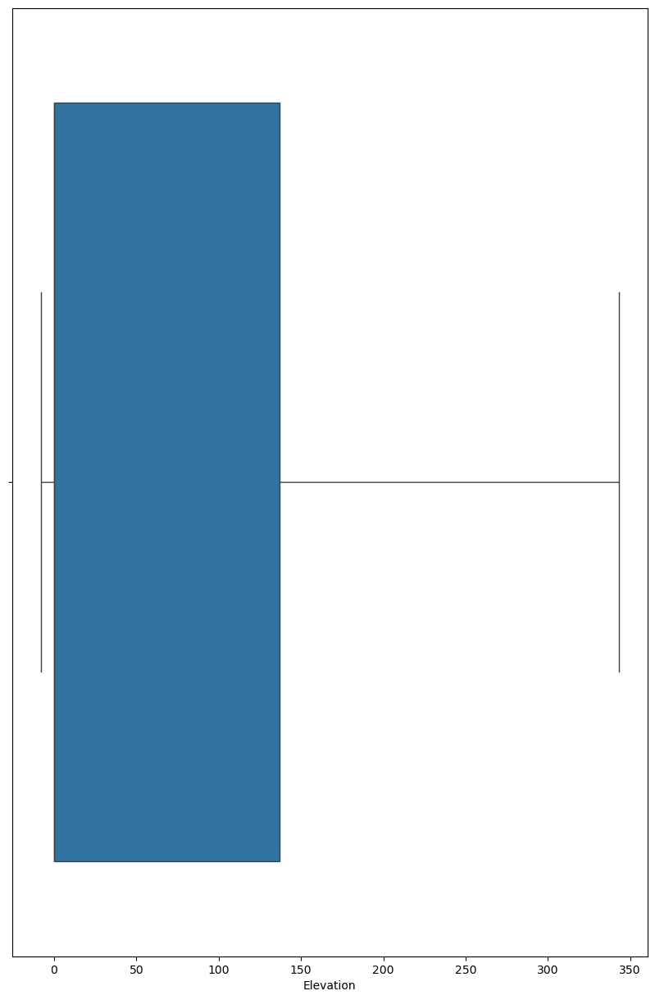

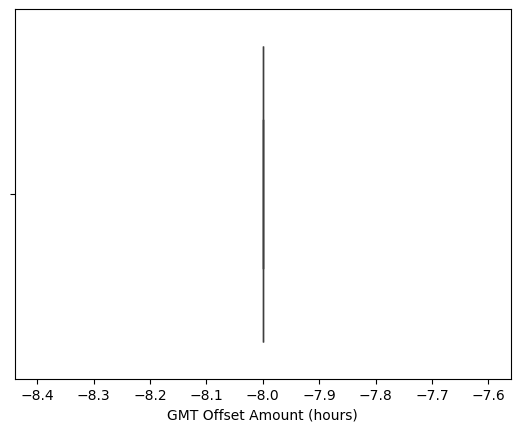

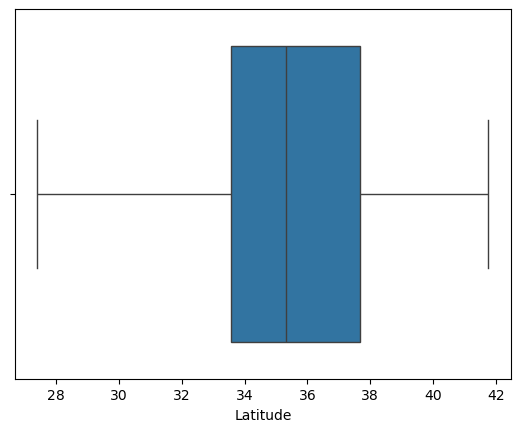

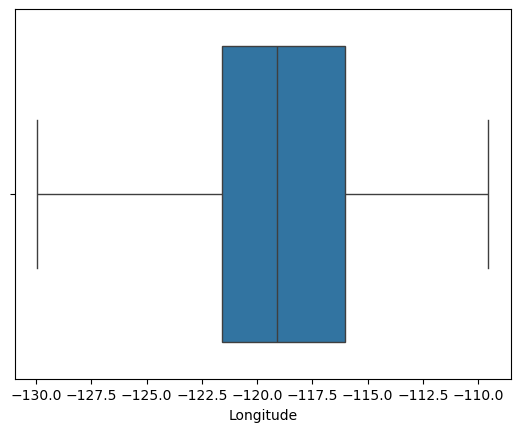

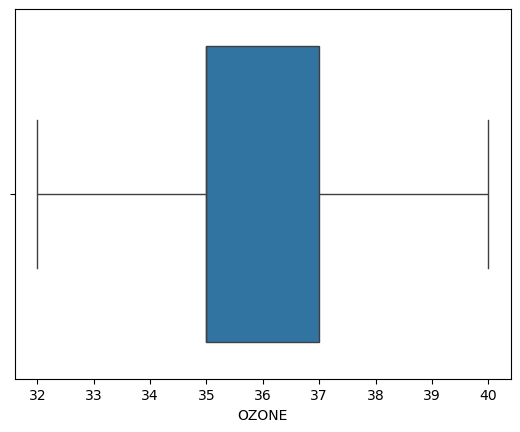

...

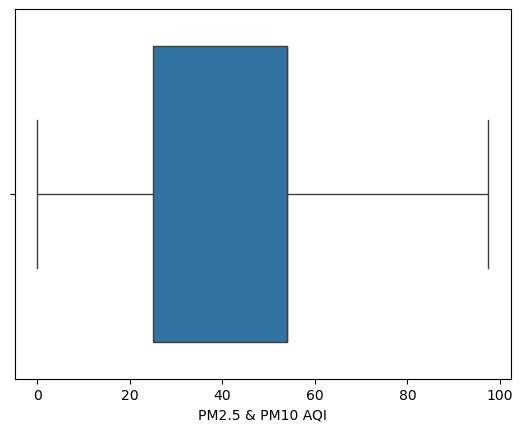

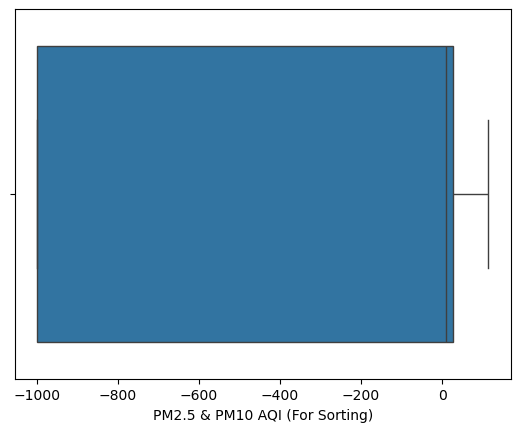

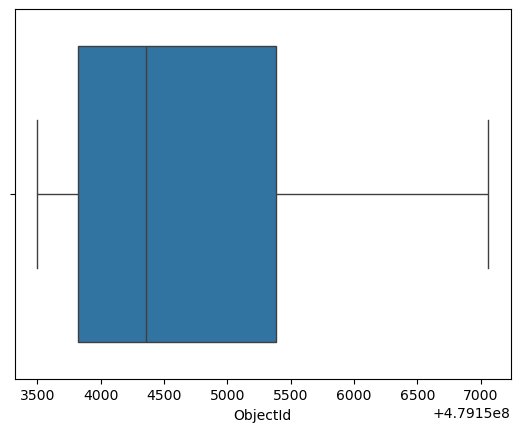

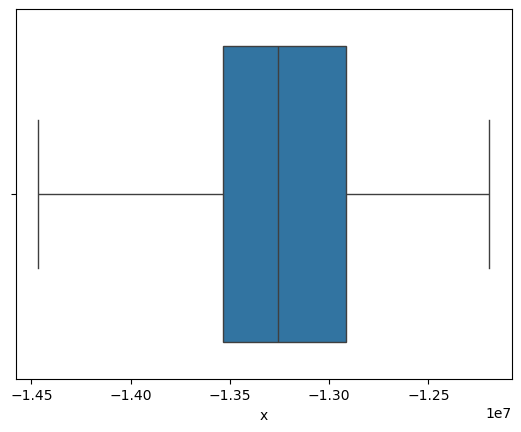

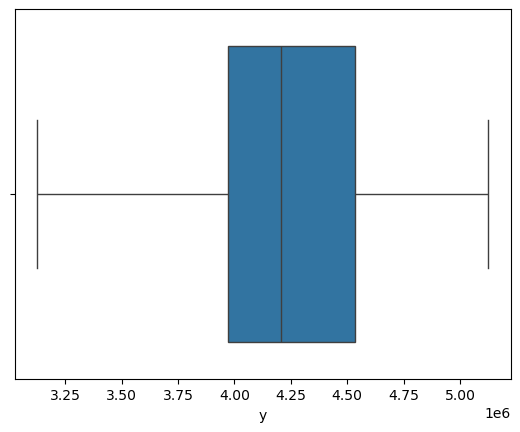

In [27]:
plt.figure(figsize=(10,15))
for i in numerical_columns:
    sns.boxplot(data = Air_quality_df, x=i)
    plt.show()

#### Handling Skewness

In [29]:
# Check skewness of numerical columns
numerical_features = Air_quality_df1.select_dtypes(include=['float64', 'int64']).columns
#numerical_features
print(Air_quality_df1[numerical_features].skew())

Elevation                         1.181262
GMT Offset Amount (hours)         0.000000
Latitude                         -0.604046
Longitude                        -0.193547
OZONE                             0.772439
Ozone & PM AQI                   -0.528617
Ozone & PM AQI (For Sorting)     -0.687886
Ozone AQI                        -0.731390
Ozone AQI (For Sorting)           0.343803
Ozone Measured at Site           -0.259961
PM10                              0.000000
PM10 AQI                          0.000000
PM10 AQI (For Sorting)            0.748703
PM10 Measured at Site             0.334884
PM2.5                             0.000000
PM2.5 AQI                         1.238026
PM2.5 AQI (For Sorting)           0.395810
PM2.5 Measured at Site           -0.437004
PM2.5 & PM10 AQI                 -0.685927
PM2.5 & PM10 AQI (For Sorting)   -0.151666
ObjectId                          0.948759
x                                -0.193547
y                                -0.569249
dtype: floa

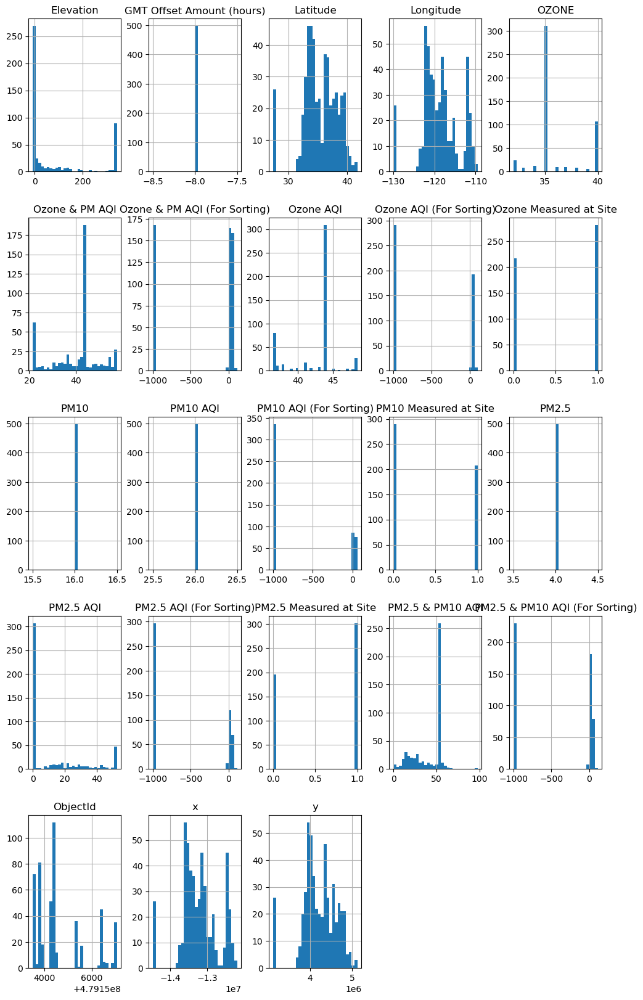

In [30]:
# Plot histograms before transformed featurs
Air_quality_df1.hist(figsize=(12, 20), bins=30)
plt.show()

In [31]:
pt = PowerTransformer(method='yeo-johnson')
Air_quality_df1[numerical_features] = pt.fit_transform(Air_quality_df1[numerical_features])

print(Air_quality_df1[numerical_features].skew())

Elevation                        -1.415458
GMT Offset Amount (hours)         0.000000
Latitude                         -0.012925
Longitude                         0.000617
OZONE                             0.016638
Ozone & PM AQI                   -0.119695
Ozone & PM AQI (For Sorting)      0.007113
Ozone AQI                        -0.039531
Ozone AQI (For Sorting)           0.423903
Ozone Measured at Site           -0.259961
PM10                              0.000000
PM10 AQI                          0.000000
PM10 AQI (For Sorting)            0.837928
PM10 Measured at Site             0.334884
PM2.5                             0.000000
PM2.5 AQI                         0.515685
PM2.5 AQI (For Sorting)           0.599226
PM2.5 Measured at Site           -0.437004
PM2.5 & PM10 AQI                 -0.479287
PM2.5 & PM10 AQI (For Sorting)    0.336198
ObjectId                          0.000000
x                                 0.000607
y                                -0.007636
dtype: floa

<Axes: ylabel='Density'>

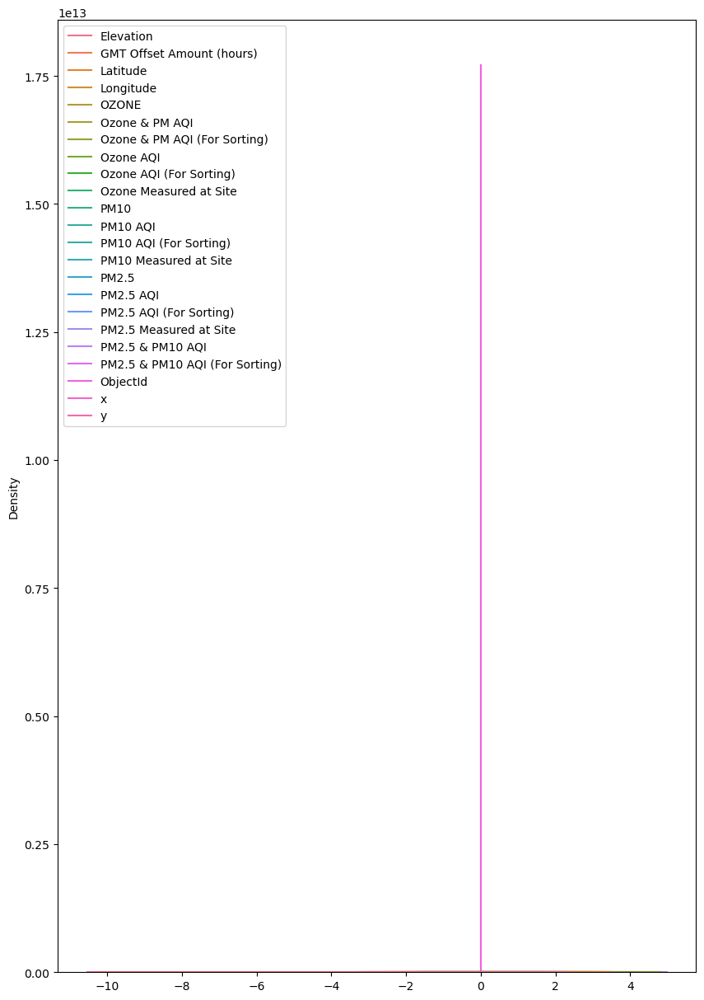

In [32]:
plt.figure(figsize=(10,15))
sns.kdeplot(Air_quality_df1)

### EDA

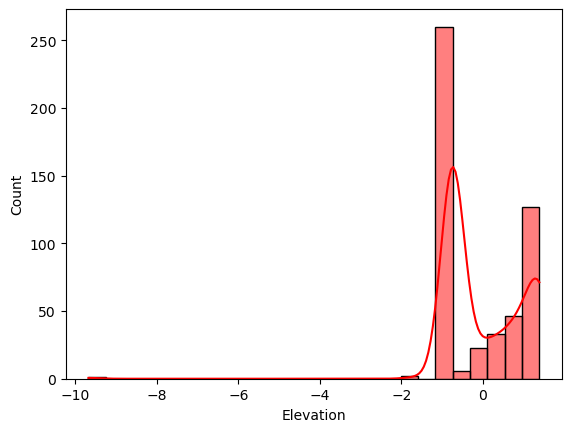

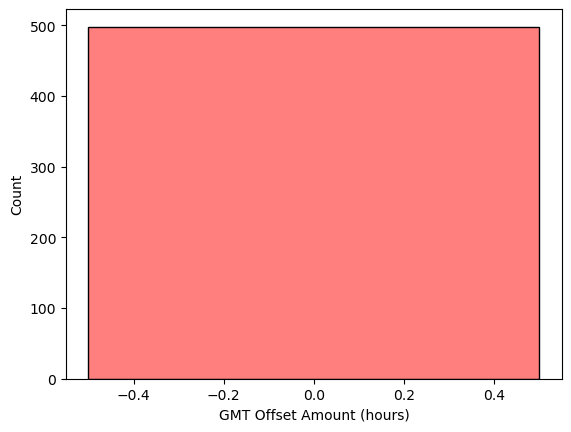

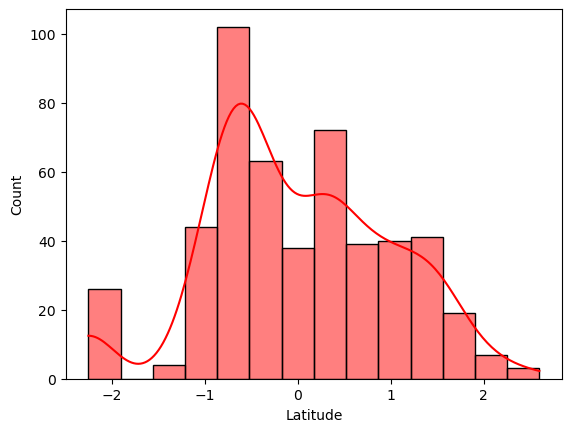

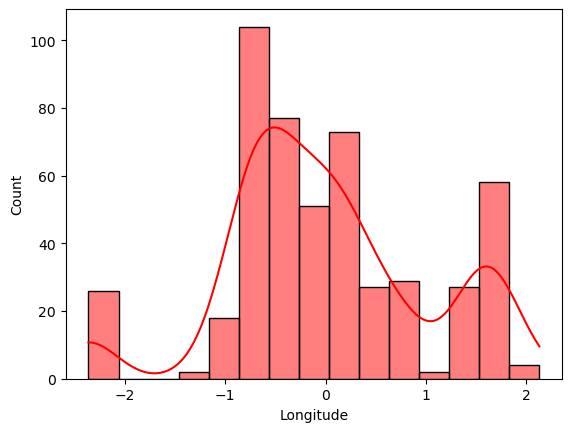

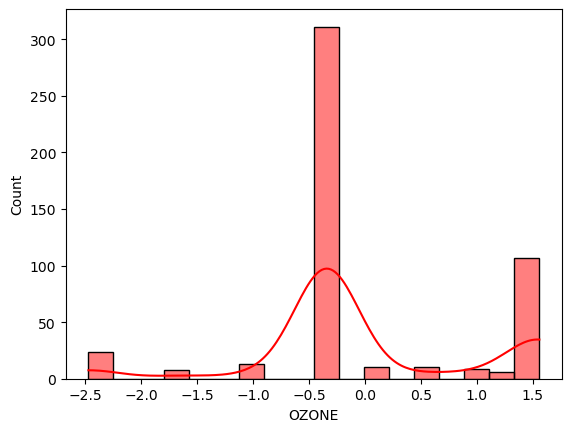

...

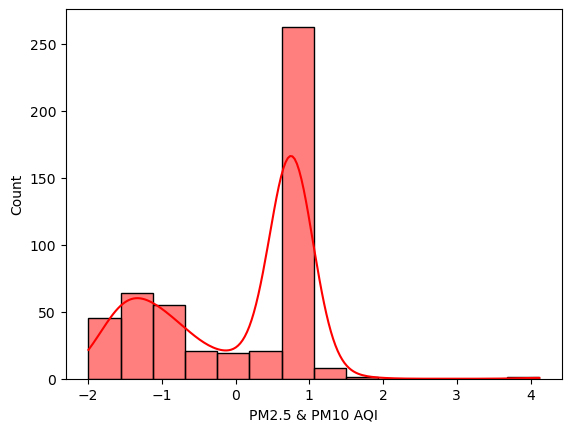

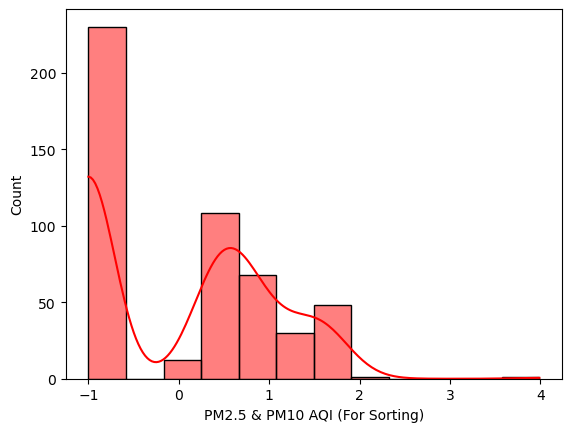

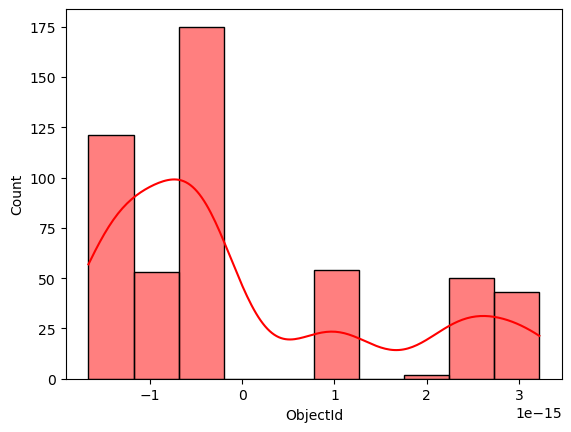

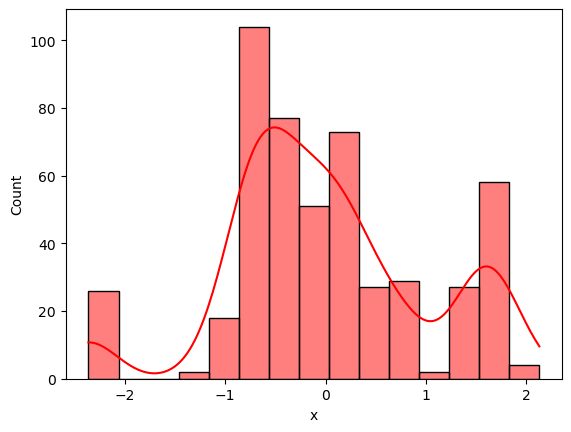

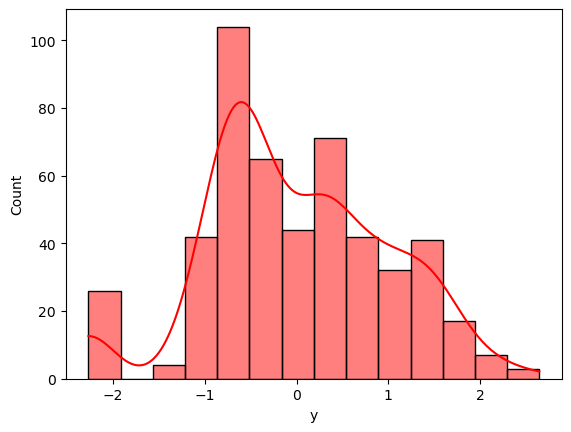

In [34]:
for i in numerical_columns:
    sns.histplot(Air_quality_df1[i], kde=True,color='red')
    plt.show()

Text(0.5, 1.0, 'Distribution of AQI Values')

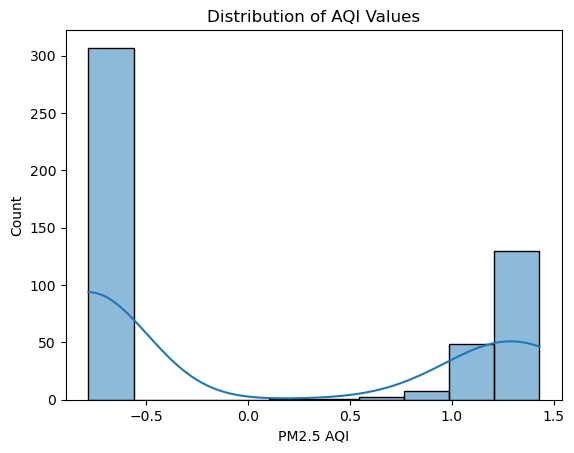

In [35]:

sns.histplot(Air_quality_df['PM2.5 AQI'], kde=True)
plt.title("Distribution of AQI Values")


([0, 1, 2, 3, 4, 5, 6, 7, 8],
 [Text(0, 0, '-0.3416552375741945'),
  Text(1, 0, '1.5593917752548463'),
  Text(2, 0, '-2.471276008137756'),
  Text(3, 0, '1.283963361420455'),
  Text(4, 0, '-0.9358391457399523'),
  Text(5, 0, '0.965278742509799'),
  Text(6, 0, '0.16361375052799285'),
  Text(7, 0, '-1.6378318776072798'),
  Text(8, 0, '0.5951615283175985')])

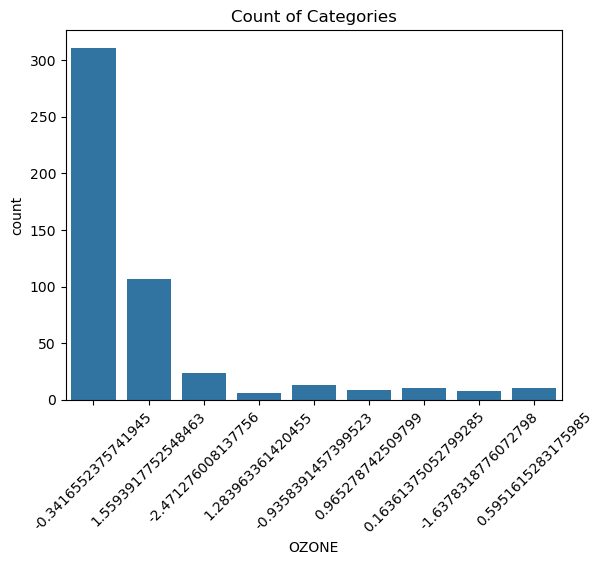

In [36]:
sns.countplot(data=Air_quality_df, x='OZONE', order=Air_quality_df1['OZONE'])
plt.title("Count of Categories")
plt.xticks(rotation=45)

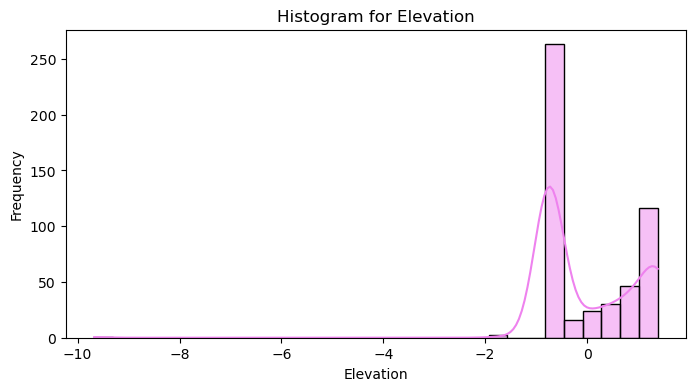

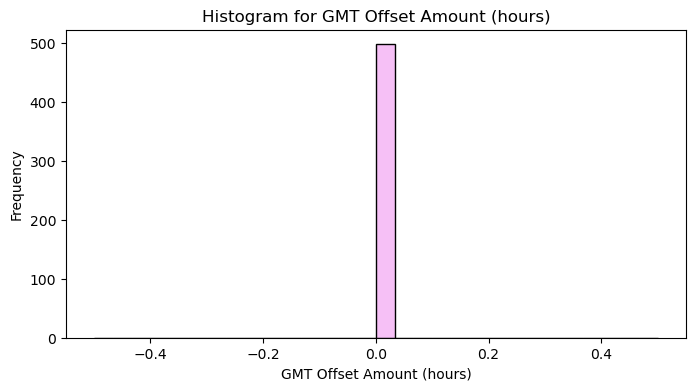

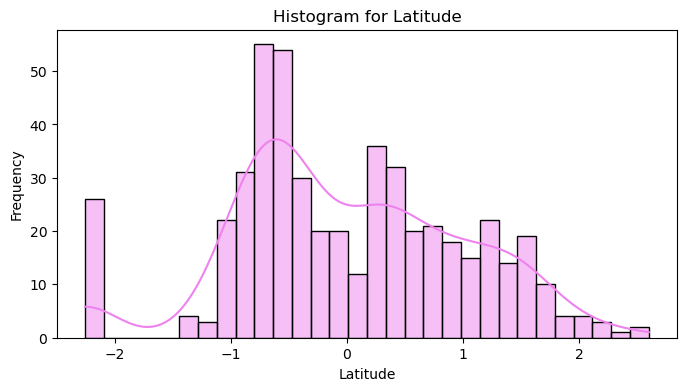

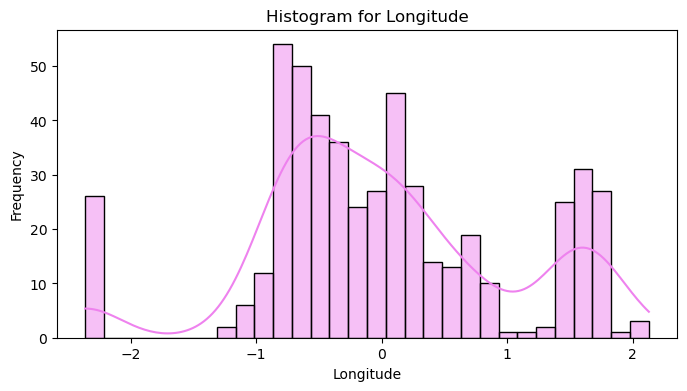

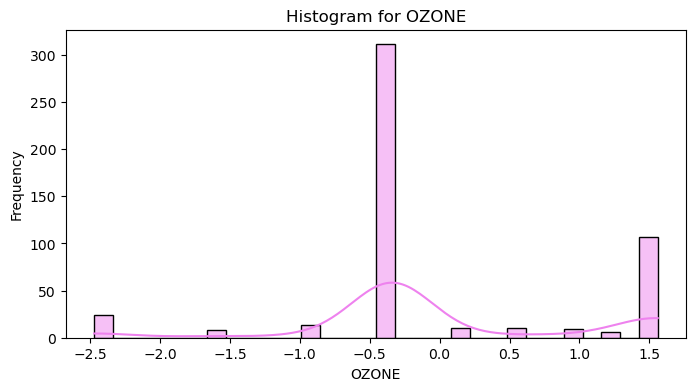

...

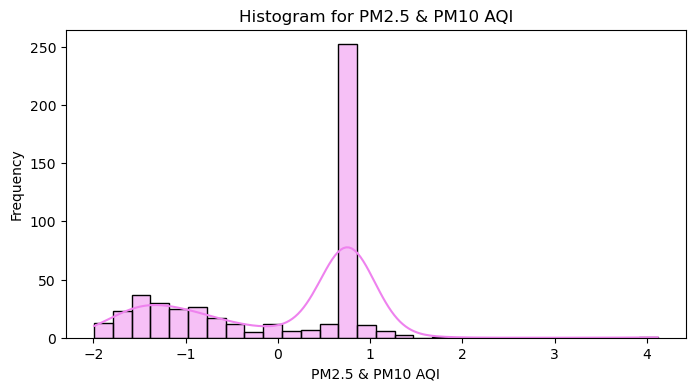

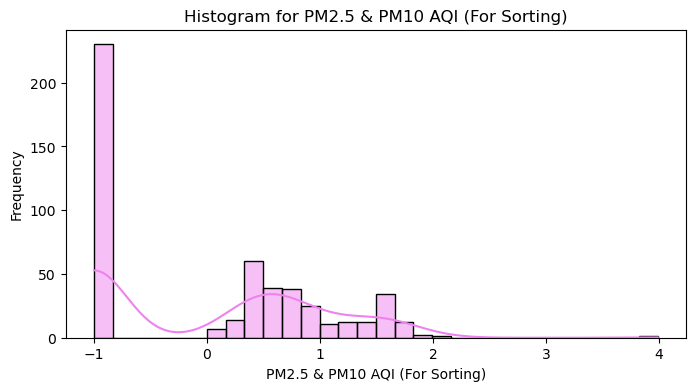

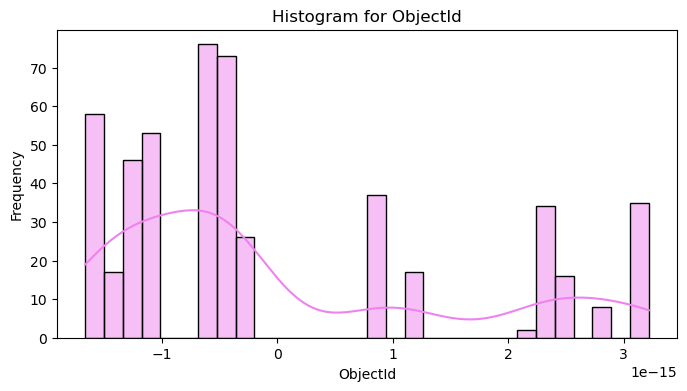

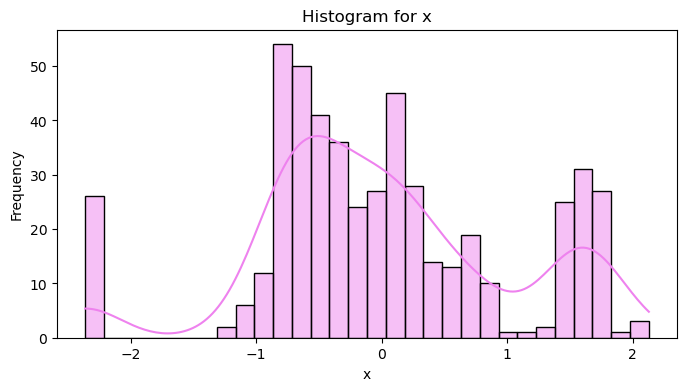

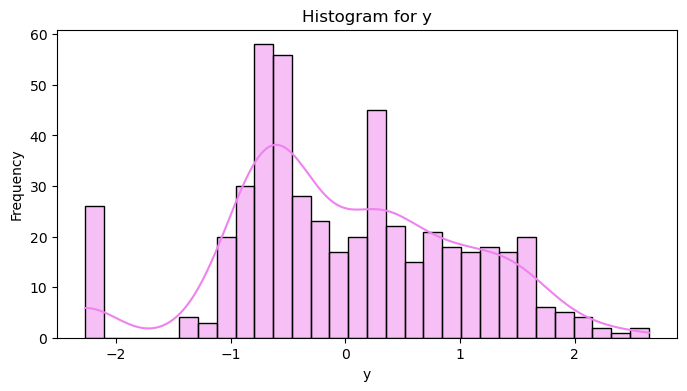

In [37]:
for column in numerical_columns:
    plt.figure(figsize=(8, 4))  # Set figure size
    sns.histplot(data=Air_quality_df, x=column, kde=True, bins=30,color='violet')  # Histogram with KDE
    plt.title(f"Histogram for {column}")
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.show()

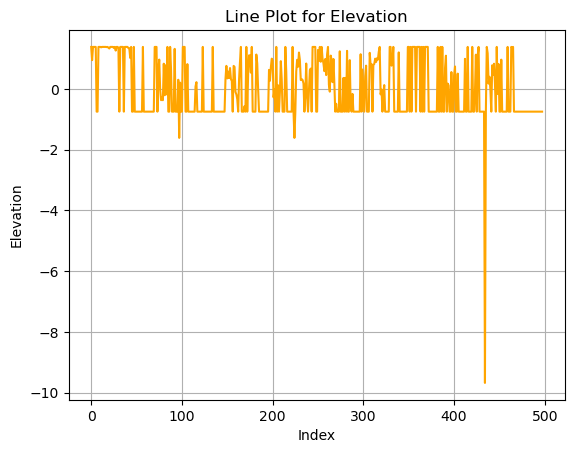

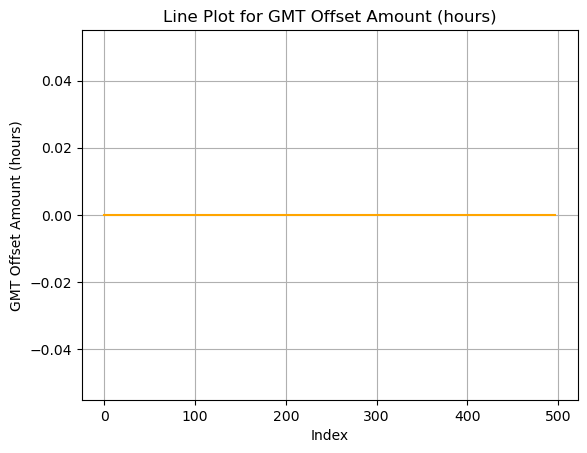

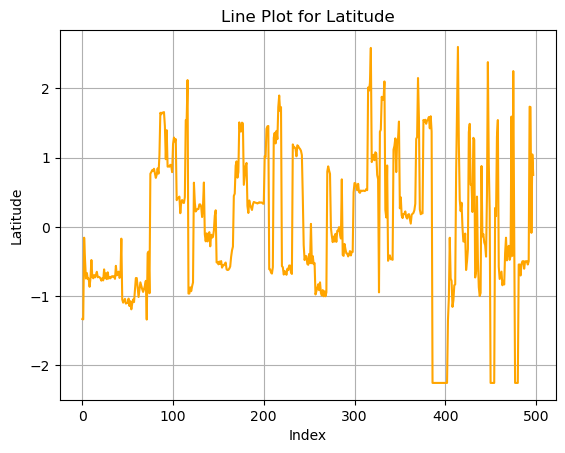

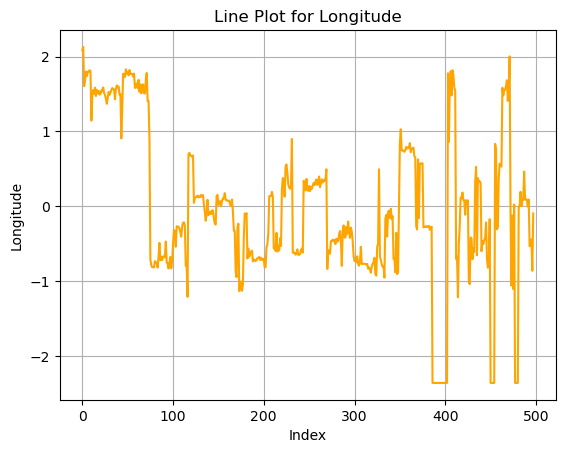

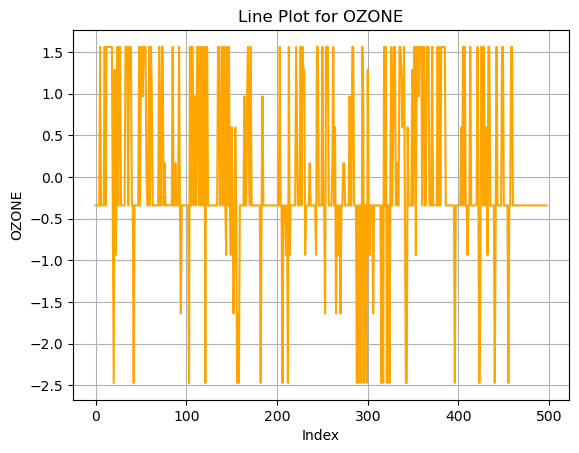

...

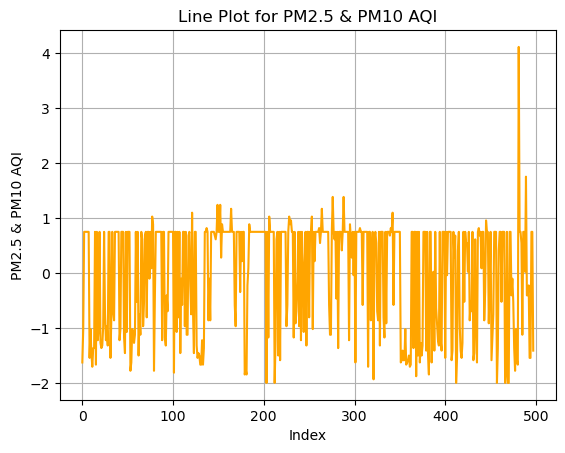

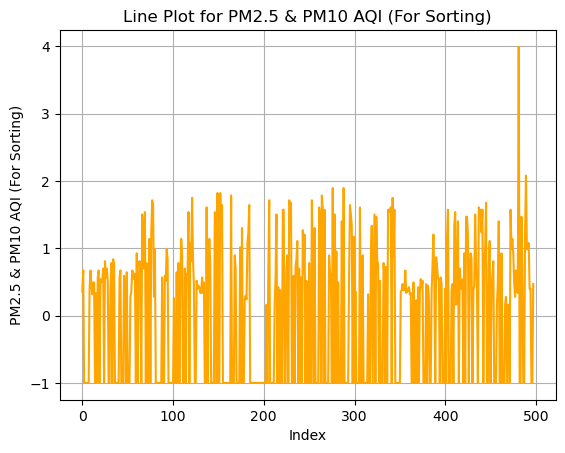

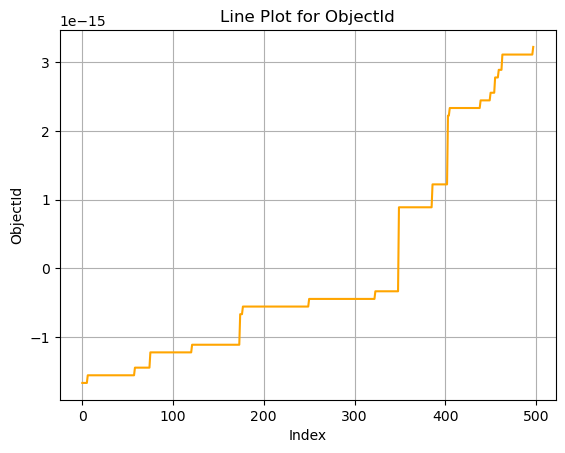

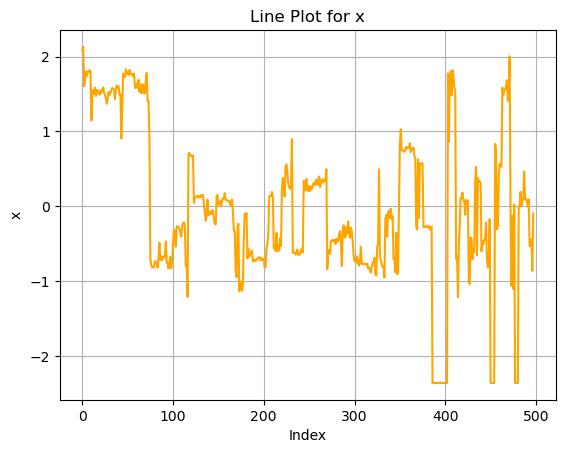

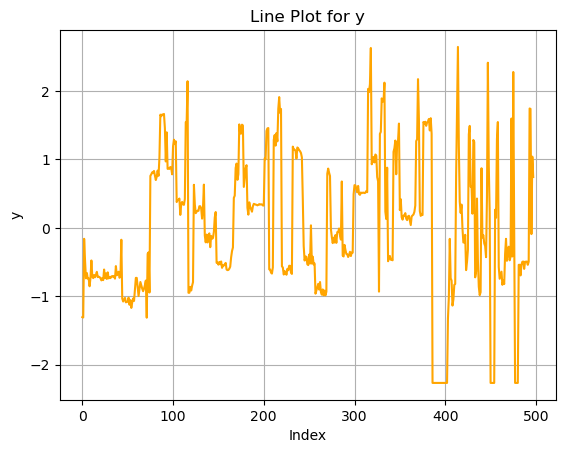

In [38]:
# Create line plots for each numerical column
for column in numerical_columns:
    plt.figure()  # New figure for each plot
    Air_quality_df[column].plot(kind='line',color='orange')
    plt.title(f"Line Plot for {column}")
    plt.xlabel("Index")
    plt.ylabel(column)
    plt.grid(True)
    plt.show()


<function matplotlib.pyplot.show(close=None, block=None)>

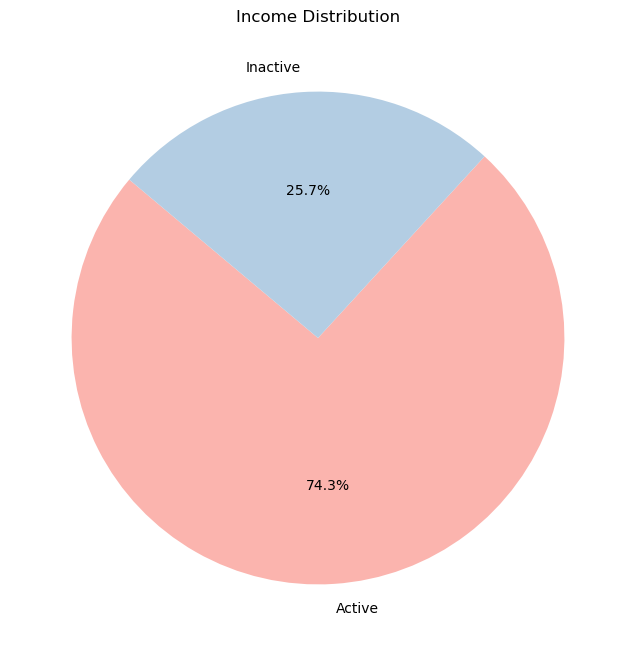

In [39]:
#Pie Chart for Income Distribution
plt.figure(figsize=(8, 8))
counts = Air_quality_df1['Site Operational Status'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Pastel1.colors  )
plt.title('Income Distribution')
plt.show

<Figure size 600x400 with 0 Axes>

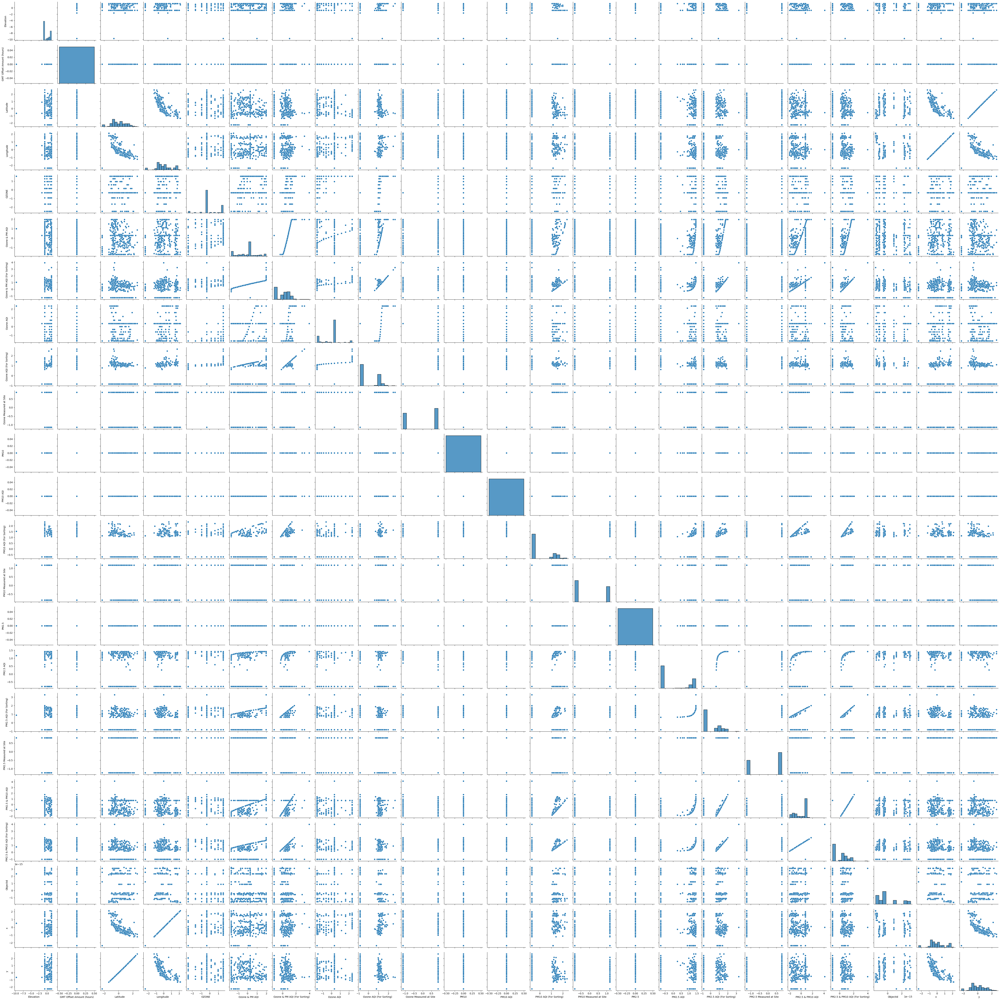

In [40]:
plt.figure(figsize=(6, 4))
sns.pairplot(Air_quality_df1)

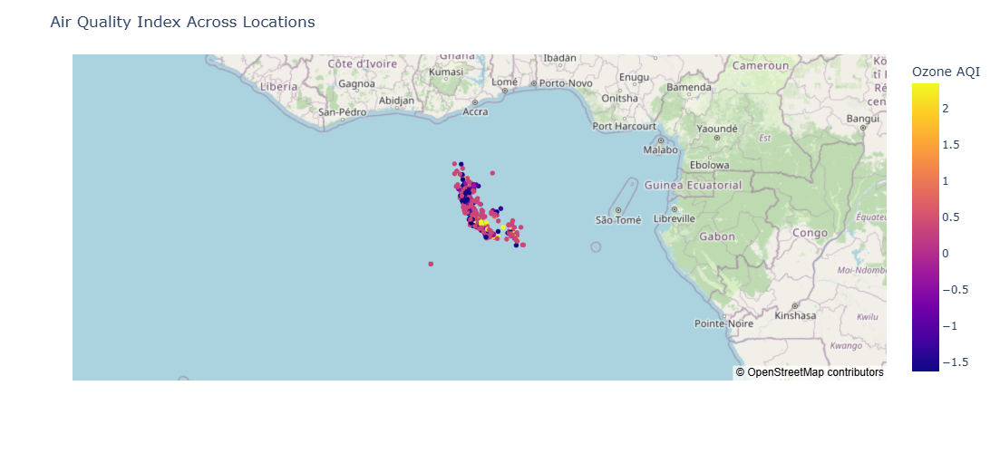

In [41]:
import plotly.express as px

fig = px.scatter_mapbox(
    Air_quality_df,
    lat='Latitude',
    lon='Longitude',
    color='Ozone AQI',  # Ensure this column exists
    hover_name='Reporting Area(s)',  # Ensure this column exists
    hover_data=['Ozone & PM AQI (For Sorting)', 'Ozone AQI'],  # Adjust if needed
    zoom=4,
    height=500
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title="Air Quality Index Across Locations")
fig.show()


<Axes: title={'center': 'Ozone AQI Trend Over Time'}, xlabel='ValidTime'>

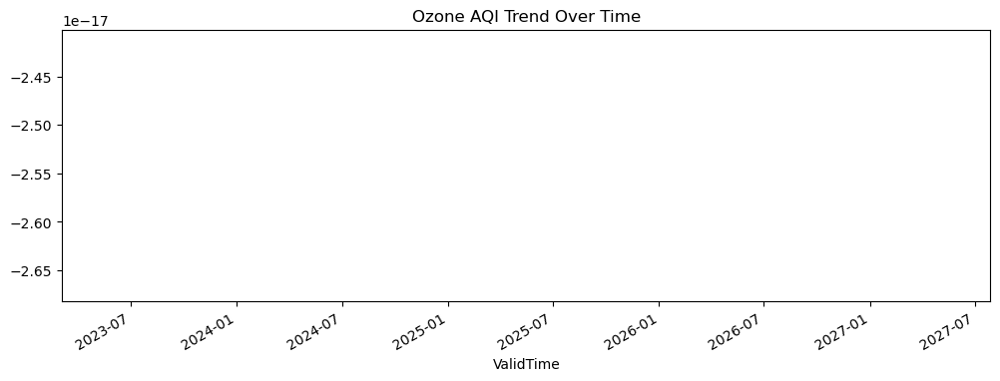

In [42]:
Air_quality_df['ValidTime'] = pd.to_datetime(Air_quality_df['ValidTime'])
Air_quality_df.groupby('ValidTime')['Ozone AQI (For Sorting)'].mean().plot(kind='line', figsize=(12,4), title='Ozone AQI Trend Over Time')


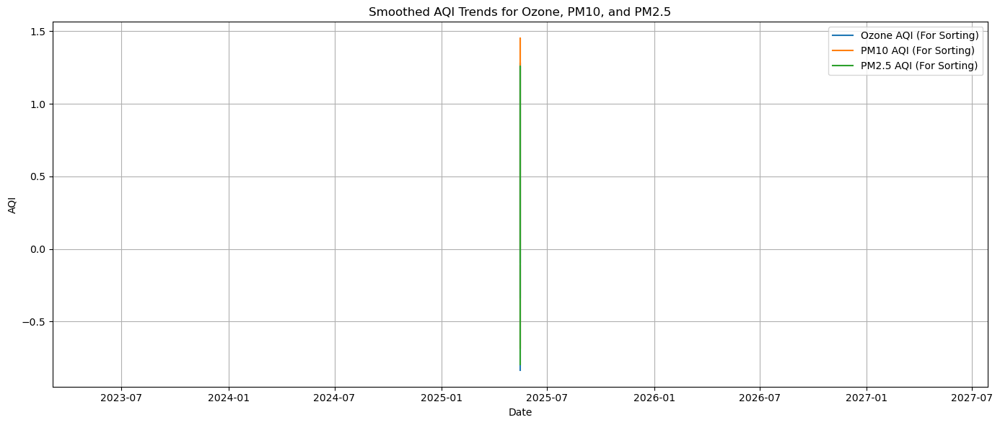

In [43]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure ValidTime is in datetime format
Air_quality_df['ValidTime'] = pd.to_datetime(Air_quality_df['ValidTime'])

# Set ValidTime as index
df_time = Air_quality_df.set_index('ValidTime')

# Select relevant AQI columns
pollutants = ['Ozone AQI (For Sorting)', 'PM10 AQI (For Sorting)', 'PM2.5 AQI (For Sorting)']

# Optional: Apply smoothing (7-period rolling average)
df_smooth = df_time[pollutants].rolling(window=7).mean()

# Plot
plt.figure(figsize=(14, 6))
for pollutant in pollutants:
    plt.plot(df_smooth.index, df_smooth[pollutant], label=pollutant)

plt.title('Smoothed AQI Trends for Ozone, PM10, and PM2.5')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [44]:
corr = Air_quality_df1[numerical_columns].corr()

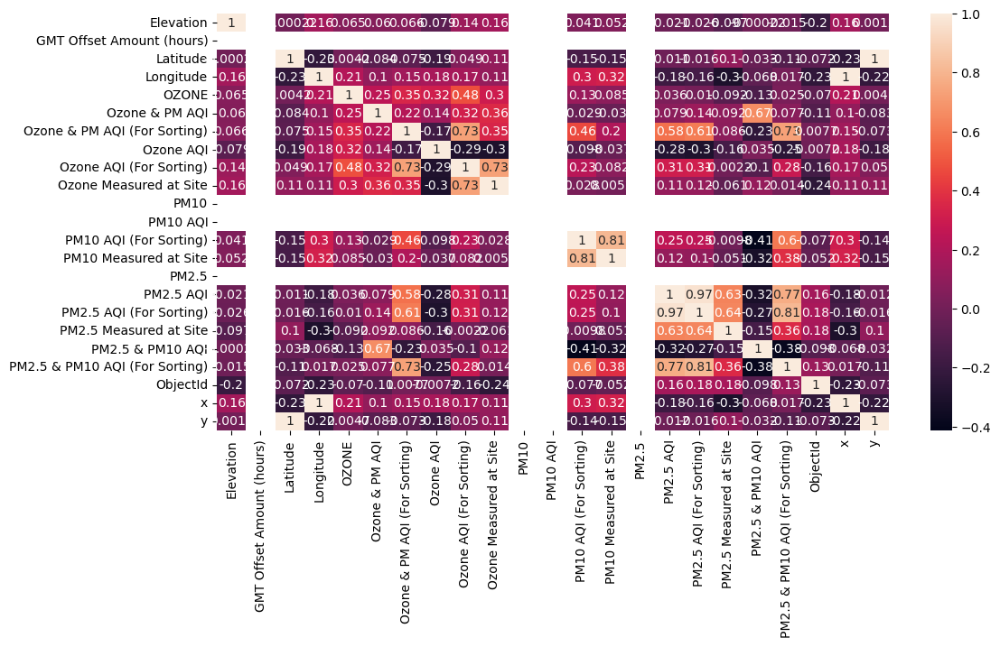

In [45]:
plt.figure(figsize=(12,6))
sns.heatmap(corr, annot = True)
plt.show()

In [46]:
X = Air_quality_df1.drop('PM2.5 AQI (For Sorting)', axis=1)
y = Air_quality_df1['PM2.5 AQI (For Sorting)']

# Encode the target variable (income)
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)  


In [47]:
y

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 14,  1, 16, 16,  0,  9,  0,
        0,  0,  0, 11,  0, 17,  0,  0,  0,  0,  0,  0,  0,  0, 12,  0,  0,
        0,  0,  0,  0,  0,  0,  0, 19, 23,  0,  0,  0, 20,  0,  0,  0,  0,
        0,  0,  6,  1, 23, 22,  0, 21,  0, 32,  0,  0,  0,  0,  0,  0,  0,
       32,  0,  0, 27,  0,  0, 29,  0, 40, 51, 49,  6, 33,  0,  0,  0,  0,
        0,  0,  0, 16,  0,  0, 20, 17, 33, 29,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, 27,  0, 14, 37, 31,  0,  0,  6,  0, 21,  0, 36,  0,
       24, 16,  0,  0, 12,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1, 16,  0,
        0, 48,  0, 26,  0, 26,  0,  0,  0,  0, 38, 44,  0, 54,  0,  0, 54,
       42, 49,  0,  0,  0,  0,  0,  0,  0,  0,  0, 53,  0,  0,  0, 31, 24,
        0,  0,  0,  0, 34,  0,  0,  0,  0,  0,  7,  0, 35, 40, 49,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        0, 20, 51,  0,  0,  0,  0,  0,  1, 19, 45,  0, 13,  0, 11,  0,  0,
       47, 47,  0,  0,  0

In [48]:
X

,EPA AQS ID,Country Code,Data Source,EPA Region,Elevation,GMT Offset Amount (hours),Latitude,Local Time at Monitor,Longitude,OZONE,...,PM2.5 & PM10 AQI (For Sorting),Reporting Area(s),Site Name,State Name,Site Operational Status,ValidTime,ObjectId,MonitorType,x,y
0,40030011,US,Arizona Department of Environmental Quality,R9,1.385334,0.0,-1.331566,2025-05-15 21:00:00 GMT-7,2.079910,-0.341655,...,0.356733,Douglas,Paul Spur Chemical Lime Plant,AZ,Active,2025-05-16 04:00:00,-1.665335e-15,Permanent,2.079922,-1.307077
1,40031005,US,Arizona Department of Environmental Quality,R9,0.950586,0.0,-1.336019,2025-05-15 21:00:00 GMT-7,2.128005,-0.341655,...,0.669943,Douglas,Douglas Red Cross,AZ,Active,2025-05-16 04:00:00,-1.665335e-15,Permanent,2.128018,-1.311382
2,40051008,US,Arizona Department of Environmental Quality,R9,1.385334,0.0,-0.156691,2025-05-15 21:00:00 GMT-7,1.603721,-0.341655,...,-1.000246,Flagstaff,Flagstaff Middle School,AZ,Inactive,2025-05-16 04:00:00,-1.665335e-15,Permanent,1.603720,-0.160976
3,40070008,US,Arizona Department of Environmental Quality,R9,1.385334,0.0,-0.483833,2025-05-15 21:00:00 GMT-7,1.682868,-0.341655,...,-1.000246,Payson,Payson Well Site,AZ,Active,2025-05-16 04:00:00,-1.665335e-15,Permanent,1.682868,-0.482431
4,40070009,US,Arizona Department of Environmental Quality,R9,1.385334,0.0,-0.746309,2025-05-15 21:00:00 GMT-7,1.798851,-0.341655,...,-1.000246,Phoenix,Miami Ridgeline,AZ,Inactive,2025-05-16 04:00:00,-1.665335e-15,Permanent,1.798854,-0.738939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
493,MMCA81010,US,California Air Resources Board,R9,-0.745604,0.0,1.735666,2025-05-15 20:00:00 GMT-8,-0.534161,-0.341655,...,0.399822,Phoenix,MMCA81010,MM,Active,2025-05-16 04:00:00,3.108624e-15,Temporary,-0.534157,1.745104
494,MMCA81011,US,California Air Resources Board,R9,-0.745604,0.0,1.730441,2025-05-15 20:00:00 GMT-8,-0.522369,-0.341655,...,0.399822,Phoenix,MMCA81011,CA,Active,2025-05-16 04:00:00,3.108624e-15,Temporary,-0.522365,1.739717
495,MMCA81014,US,California Air Resources Board,R9,-0.745604,0.0,-0.086577,2025-05-15 20:00:00 GMT-8,-0.442782,-0.341655,...,-1.000246,Phoenix,MMCA81014,MM,Active,2025-05-16 04:00:00,3.108624e-15,Temporary,-0.442778,-0.091810
496,MMCA81021,US,California Air Resources Board,R9,-0.745604,0.0,1.046411,2025-05-15 20:00:00 GMT-8,-0.862680,-0.341655,...,-1.000246,Phoenix,MMCA81021,MM,Active,2025-05-16 04:00:00,3.108624e-15,Temporary,-0.862674,1.040797


In [49]:
 #Perform one-hot encoding
X = pd.get_dummies(X, columns=categorical_columns, drop_first=True)

# Verify the result
print("Shape of X after one-hot encoding:", X.shape)
print("First 5 rows of the transformed dataset:\n", X.head())

Shape of X after one-hot encoding: (498, 1469)
First 5 rows of the transformed dataset:
    Elevation  GMT Offset Amount (hours)  Latitude  Longitude     OZONE  \
0   1.385334                        0.0 -1.331566   2.079910 -0.341655   
1   0.950586                        0.0 -1.336019   2.128005 -0.341655   
2   1.385334                        0.0 -0.156691   1.603721 -0.341655   
3   1.385334                        0.0 -0.483833   1.682868 -0.341655   
4   1.385334                        0.0 -0.746309   1.798851 -0.341655   

   Ozone & PM AQI  Ozone & PM AQI (For Sorting)  Ozone AQI  \
0       -1.725492                     -0.156538   0.344667   
1       -1.481312                      0.181383   0.344667   
2        0.288608                     -1.255689   0.344667   
3        0.288608                     -1.255689   0.344667   
4        0.288608                     -1.255689   0.344667   

   Ozone AQI (For Sorting)  Ozone Measured at Site  ...  \
0                -0.833984        

In [50]:
# Check data types of all columns
print(X.dtypes)

# Convert boolean columns to integers or floats
for col in X.columns:
    if X[col].dtype == 'bool':  # Check if the column is boolean
        X[col] = X[col].astype(int)  # Convert to integers (1 and 0)
        

# Ensure no columns are categorical anymore
if X.select_dtypes(include='object').empty and X.select_dtypes(include='bool').empty:
    print("All columns are now numeric!")

Elevation                           float64
GMT Offset Amount (hours)           float64
Latitude                            float64
Longitude                           float64
OZONE                               float64
                                     ...   
State Name_MM                          bool
State Name_MX                          bool
State Name_NV                          bool
Site Operational Status_Inactive       bool
MonitorType_Temporary                  bool
Length: 1469, dtype: object
All columns are now numeric!


#### FEATURE SELECTION

In [52]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

In [53]:
# Train Random forest
rf = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=5)
rf.fit(X, y)

RandomForestRegressor(max_depth=5, random_state=42)

In [54]:
# Get feature importances
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index=X.columns,
                                   columns=["importance"]).sort_values("importance", ascending=False)

# Display the most important features
print(feature_importances)



                                  importance
PM2.5 AQI                           0.981755
PM2.5 & PM10 AQI                    0.010486
PM2.5 & PM10 AQI (For Sorting)      0.006306
Ozone & PM AQI (For Sorting)        0.000668
Ozone & PM AQI                      0.000434
...                                      ...
EPA AQS ID_40134006                 0.000000
Ozone & PM AQI (For Labeling)_6     0.000000
Ozone & PM AQI (For Labeling)_59    0.000000
EPA AQS ID_150090025                0.000000
EPA AQS ID_320030022                0.000000

[1469 rows x 1 columns]


In [55]:
feature_importances.head(10)

,importance
PM2.5 AQI,0.981755
PM2.5 & PM10 AQI,0.010486
PM2.5 & PM10 AQI (For Sorting),0.006306
Ozone & PM AQI (For Sorting),0.000668
Ozone & PM AQI,0.000434
PM2.5 AQI (For Labeling)_ND,0.000089
PM2.5 AQI (For Labeling)_21,0.000026
PM2.5 AQI (For Labeling)_13,0.000014
y,0.000014
PM2.5 AQI (For Labeling)_31,0.000012


In [56]:
# Select top 10 features
top_n_features = feature_importances.head(10).index
print(f"Top 10 features: {top_n_features}")

Top 10 features: Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31'],
      dtype='object')


#### SPLITTING DATA

In [58]:
top_n_features = feature_importances.head(10).index # Top 10 features
X_selected = X[top_n_features]
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

In [59]:
X_selected.head(25)

,PM2.5 AQI,PM2.5 & PM10 AQI,PM2.5 & PM10 AQI (For Sorting),Ozone & PM AQI (For Sorting),Ozone & PM AQI,PM2.5 AQI (For Labeling)_ND,PM2.5 AQI (For Labeling)_21,PM2.5 AQI (For Labeling)_13,y,PM2.5 AQI (For Labeling)_31
0,-0.783661,-1.621367,0.356733,-0.156538,-1.725492,1,0,0,-1.307077,0
1,-0.783661,-1.014729,0.669943,0.181383,-1.481312,1,0,0,-1.311382,0
2,-0.783661,0.754710,-1.000246,-1.255689,0.288608,1,0,0,-0.160976,0
3,-0.783661,0.754710,-1.000246,-1.255689,0.288608,1,0,0,-0.482431,0
4,-0.783661,0.754710,-1.000246,-1.255689,0.288608,1,0,0,-0.738939,0
5,-0.783661,0.754710,-1.000246,3.237757,1.968536,1,0,0,-0.661568,0
6,-0.783661,0.754710,-1.000246,-1.255689,0.288608,1,0,0,-0.743048,0
7,-0.783661,0.754710,-1.000246,-1.255689,0.288608,1,0,0,-0.739469,0
8,-0.783661,-1.538397,0.399822,-0.110652,-1.725492,1,0,0,-0.855229,0
9,-0.783661,-1.014729,0.669943,0.181383,-1.481312,1,0,0,-0.732988,0


In [60]:
#scaling 
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.fit_transform(X_test)

In [61]:
print("Training set shape (features):",X_train_scaled.shape)
print("Test set shape(features):",X_test_scaled.shape)
print("Training set shape(target):",y_train.shape)
print("Test set shape(target):",y_test.shape)

Training set shape (features): (398, 10)
Test set shape(features): (100, 10)
Training set shape(target): (398,)
Test set shape(target): (100,)


In [62]:
#model Building
models={
    '1.Linear Regression':LinearRegression(),
    '2.Decision Tree Regressor':DecisionTreeRegressor(),
    '3.Random Forest Regressor':RandomForestRegressor(),
    '4.Gradient Boosting Regressor':GradientBoostingRegressor(),
    '5.Support Vector Regressor':SVR(),
}

In [63]:
#model Evaluation
results={} #use to store evaluation result


for model_name,model in models.items():
    #fit the model
    model.fit(X_train_scaled,y_train)
    #make the prediction
    y_pred=model.predict(X_test_scaled)
    #Evaluate the model
    mse=mean_squared_error(y_test,y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    r2=r2_score(y_test,y_pred)
    rmse=np.sqrt(mean_squared_error(y_test,y_pred))
    #store the result
    results[model_name]={"MSE:":mse,"R2:":r2,"MAE:":mae,"RMSE:":rmse}

In [64]:
results_df=pd.DataFrame(results).T
print(results_df)

                                     MSE:       R2:      MAE:      RMSE:
1.Linear Regression             35.280719  0.902144  4.797338   5.939757
2.Decision Tree Regressor      129.360000  0.641203  6.340000  11.373654
3.Random Forest Regressor       90.038724  0.750266  5.572000   9.488874
4.Gradient Boosting Regressor  138.456278  0.615973  6.783898  11.766745
5.Support Vector Regressor      38.087950  0.894358  3.419302   6.171544


In [65]:
linear_model = LinearRegression()
param_grid={}

In [66]:
grid_search = GridSearchCV(linear_model, param_grid, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)

# Best model (same as input since no tuning)
best_linear = grid_search.best_estimator_


In [67]:
y_pred = best_linear.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("Linear Regression R² Score on Test Data:", r2)


Linear Regression R² Score on Test Data: 0.9327398143693054


In [68]:
# Predict on the test data
y_test_pred = best_linear.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Test MSE: {test_mse:.2f}")
print(f"Test R² Score: {test_r2:.4f}")



Test MSE: 48.17
Test R² Score: 0.8664


In [69]:
#pipeline
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
# Create the pipeline
pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),  # Handle missing values
    ('scaler', StandardScaler()),                # Scale the features
    ('model', LinearRegression())           # Random Forest Regressor
])
# Train the pipeline
pipeline.fit(X_train, y_train)
# Predict on test data
y_pred = pipeline.predict(X_test)

In [70]:
# Assuming X_train is a DataFrame with column names
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Now you can access column names
print(X_train_scaled_df.columns)

Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31'],
      dtype='object')


In [71]:
X_train.columns

Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31'],
      dtype='object')

In [72]:
pipeline.fit(X_train, y_train) #pipelin fitting

Pipeline(steps=[('imputer', SimpleImputer()), ('scaler', StandardScaler()),
                ('model', LinearRegression())])

In [73]:
X_train.columns

Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31'],
      dtype='object')

In [74]:
y_pred=pipeline.predict(X_test)

In [75]:
import joblib
joblib.dump(pipeline, 'LinearRegression_pipeline.joblib')

['LinearRegression_pipeline.joblib']

#### UNSEEN DATA PREDICTION

In [77]:
loaded_pipeline = joblib.load('LinearRegression_pipeline.joblib')

In [78]:
unseen = pd.read_csv('AQI Prediction.csv') #load unseen data

In [79]:
unseen

,PM2.5 AQI,PM2.5 & PM10 AQI,PM2.5 & PM10 AQI (For Sorting),Ozone & PM AQI (For Sorting),Ozone & PM AQI,PM2.5 AQI (For Labeling)_ND,PM2.5 AQI (For Labeling)_21,PM2.5 AQI (For Labeling)_13,y,PM2.5 AQI (For Labeling)_31,y_actual
0,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.735547,0,17
1,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,18
2,1.783661,-1.354710,0.300246,1.027765,0.951283,1,0,0,0.723005,0,10
3,1.013849,-1.661163,0.336023,1.029352,0.946912,0,0,0,0.687559,0,12
4,1.163339,-1.370235,0.492027,1.028765,0.983828,0,0,0,0.780322,0,15
5,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,17
6,1.174339,-1.360235,0.493027,1.029765,0.993828,0,0,0,0.780322,0,14
7,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,15
8,1.071174,-1.260624,0.540849,1.028765,0.994874,0,0,1,0.737708,0,13
9,1.783661,-1.360235,0.492027,0.912200,-0.038485,1,0,0,-0.768901,0,13


In [80]:
unseen.columns

Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31',
       'y_actual'],
      dtype='object')

In [81]:
df_unseen=pd.DataFrame(data=unseen) #convert to Dataframe

In [82]:
X_unseen = df_unseen.drop('y_actual', axis=1)  # Drop the target column


In [83]:
y_actual = df_unseen['y_actual']  # The true target labels

In [84]:
y_pred_unseen = loaded_pipeline.predict(X_unseen)

In [85]:
y_test_pred=pipeline.predict(X_unseen) #prediction based on X_unseen data

In [86]:
X_unseen.columns

Index(['PM2.5 AQI', 'PM2.5 & PM10 AQI', 'PM2.5 & PM10 AQI (For Sorting)',
       'Ozone & PM AQI (For Sorting)', 'Ozone & PM AQI',
       'PM2.5 AQI (For Labeling)_ND', 'PM2.5 AQI (For Labeling)_21',
       'PM2.5 AQI (For Labeling)_13', 'y', 'PM2.5 AQI (For Labeling)_31'],
      dtype='object')

In [87]:
unseen['unseen_pred']=y_test_pred # assign a column unseen pred

In [88]:
unseen.to_csv('unseenpred_AQI.csv',index=False) #save as csv file

In [89]:
predicted_unseen=pd.read_csv('unseenpred_AQI.csv') #read file

In [90]:
predicted_unseen

,PM2.5 AQI,PM2.5 & PM10 AQI,PM2.5 & PM10 AQI (For Sorting),Ozone & PM AQI (For Sorting),Ozone & PM AQI,PM2.5 AQI (For Labeling)_ND,PM2.5 AQI (For Labeling)_21,PM2.5 AQI (For Labeling)_13,y,PM2.5 AQI (For Labeling)_31,y_actual,unseen_pred
0,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.735547,0,17,16.865147
1,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,18,16.874214
2,1.783661,-1.354710,0.300246,1.027765,0.951283,1,0,0,0.723005,0,10,11.901869
3,1.013849,-1.661163,0.336023,1.029352,0.946912,0,0,0,0.687559,0,12,11.950579
4,1.163339,-1.370235,0.492027,1.028765,0.983828,0,0,0,0.780322,0,15,16.721558
5,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,17,16.874214
6,1.174339,-1.360235,0.493027,1.029765,0.993828,0,0,0,0.780322,0,14,16.888014
7,1.173339,-1.360235,0.492027,1.028765,0.993828,0,0,0,0.790322,0,15,16.874214
8,1.071174,-1.260624,0.540849,1.028765,0.994874,0,0,1,0.737708,0,13,12.790139
9,1.783661,-1.360235,0.492027,0.912200,-0.038485,1,0,0,-0.768901,0,13,13.955758


In [91]:
# unseen metrics finding
test_mae = mean_absolute_error(y_actual,y_test_pred)
test_r2 = r2_score(y_actual, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_actual, y_test_pred))

    
print(f"Test test_mae: {test_mae:.2f}")
print(f"Test test_r2: {test_r2:.2f}")
print(f"Test rmse: {test_rmse:.2f}")


Test test_mae: 1.06
Test test_r2: 0.80
Test rmse: 1.35


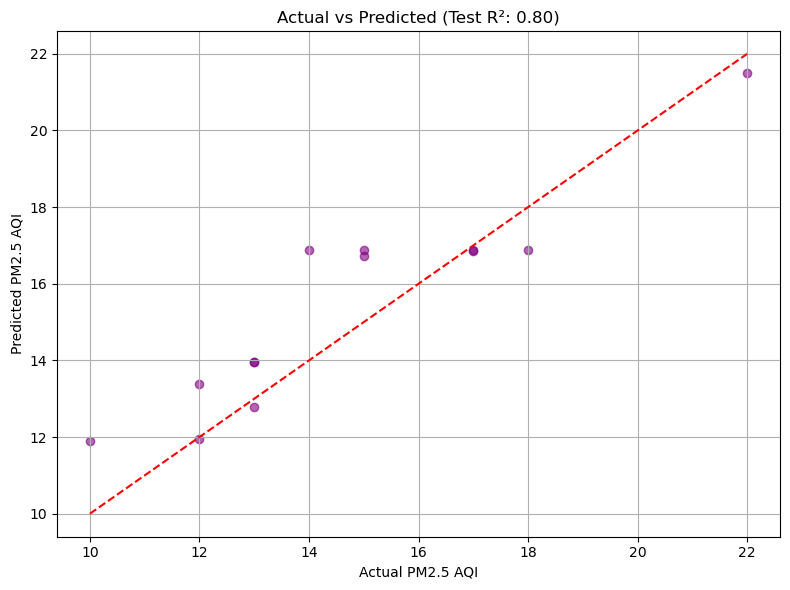

In [179]:
plt.figure(figsize=(8, 6))
plt.scatter(y_actual, y_test_pred, color='purple', alpha=0.6)
plt.plot([min(y_actual), max(y_actual)], [min(y_actual), max(y_actual)], 'r--')  # ideal line
plt.xlabel("Actual PM2.5 AQI")
plt.ylabel("Predicted PM2.5 AQI")
plt.title(f"Actual vs Predicted (Test R²: {test_r2:.2f})")
plt.grid(True)
plt.tight_layout()
plt.show()

### Conclusion

Conclusion:
In this project, we aimed to predict the PM2.5 AQI (For Sorting) using air quality monitoring data. After comparing various models, Linear Regression was identified as the best-performing model based on its simplicity and initial evaluation metrics. A preprocessing pipeline was created, and the model was trained using the top 10 most important features selected through random forest feature selection techniques. After the pipeline building, predict the unseen data. It achieves an R² of 0.80 based on the trained pipeline. The model is able to explain 80% of the variance in the target variable based on the input features.





### Future Relevance of This Dataset and Prediction:
The prediction of air quality using this dataset holds significant future relevance in addressing growing environmental and public health concerns. As urbanization and industrialization continue to rise, timely and accurate forecasting of pollutants like PM2.5 and Ozone becomes critical for decision-makers, healthcare providers, and the general public. This dataset enables the development of predictive models that can support early warnings for poor air quality, helping to reduce exposure-related health risks. Additionally, such predictions can assist government bodies in policy planning, traffic control, and industrial regulation. With continuous data collection and model refinement, this dataset can contribute to the creation of sustainable smart city systems, promoting cleaner and healthier environments in the long term.

